In [1]:
# run this to import all necessary functions
import os
from os import walk
import numpy as np
import pandas as pd
import random
import math
import plotly.graph_objects as go
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from scipy.optimize import least_squares
from scipy.optimize import fsolve
from scipy.stats import norm
from tqdm import tqdm
import warnings
# alternative to optimisation by curvefit
from scipy.optimize import differential_evolution
from scipy.signal import butter, lfilter
from scipy import stats
from ipywidgets import interact, FloatSlider
# for plotly graph display offline inside the notebook itself.
import plotly.offline as pyo
from plotly.offline import init_notebook_mode
import os
# install helper functions
from master_functions import *

In [2]:
# load data
folder='example data'
filename='NPYwtgfpnegb.xlsx'

stim_time = 1350 # change to correct value
baseline = True # if mean of baseline has not been subtracted from traces
time = True # if 1st column of your xlxs/csv file is time in ms

x_orig, df_orig = load_data(folder=folder, filename=filename, stim_time=stim_time, baseline=baseline, time=time)

# if Time is not included then require the time step dt (in ms); This will most likely be 0.1 ms (i.e. 10KHz) 
# or 0.05 ms (i.e. 20KHz). And if it's higher than 0.1 ms, it probably shouldn't be for ephys
# if Time = False then do this:
# dt = 0.1
# x, df = load_data(folder=folder, filename=filename, stim_time=stim_time, baseline=baseline, dt=dt, time=False)


In [3]:
# create a new data frame df1 and x1 with only first 300 ms of data
df = df_orig[x_orig<300]
x = x_orig[x_orig<300]

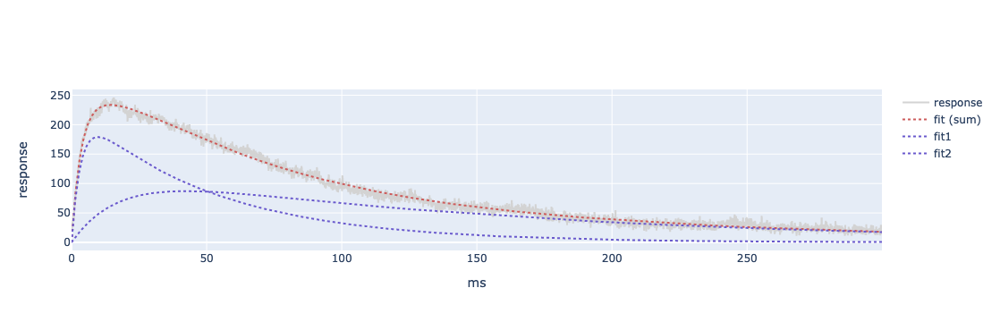

            peak   τrise   τdecay   tpeak rise20-80 decay80-20       area
fast:    179.083   3.388   50.746   9.825     3.359     70.406  11029.065
slow:     87.161  17.514  148.133  42.409     15.26    206.754  17191.305
AIC:   19459.604                                                         


In [4]:
# 1st trace
y = df.iloc[:, 0].values# Example usage fitting single alpha
# set a seed
np.random.seed(7)
FITproduct2(x, y)


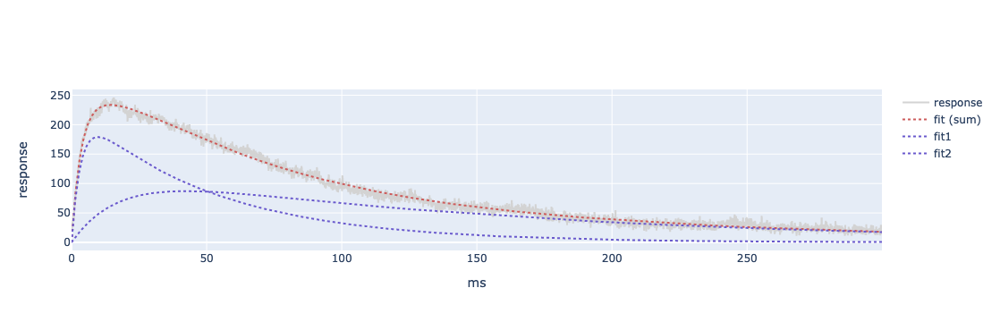

            peak   τrise   τdecay   tpeak rise20-80 decay80-20       area
fast:    179.083   3.388   50.746   9.825     3.359     70.406  11029.065
slow:     87.161  17.514  148.133  42.409     15.26    206.754  17191.305
AIC:   19459.604                                                         


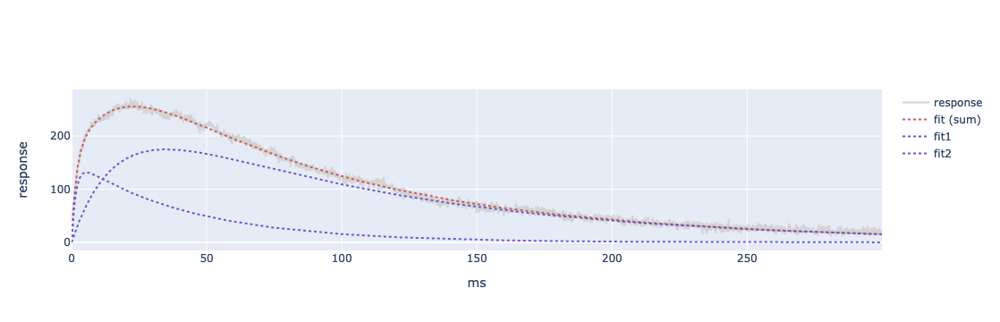

            peak   τrise   τdecay   tpeak rise20-80 decay80-20       area
fast:    131.577     1.6   43.456   5.484     1.758     60.245   6486.961
slow:    174.877  16.043  101.335  35.132     12.92    142.706  25064.667
AIC:   18646.972                                                         


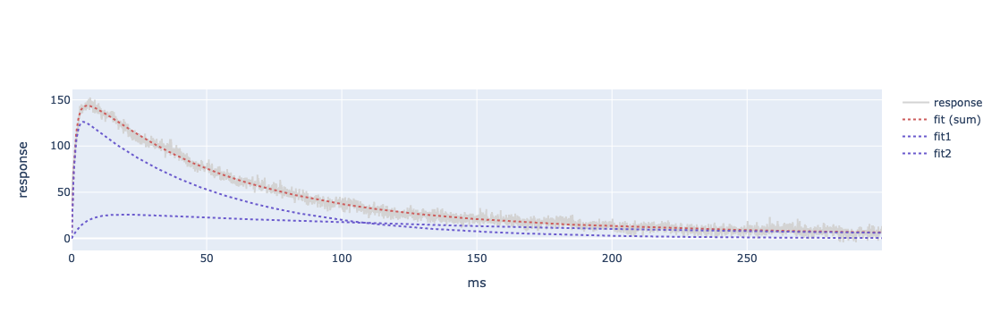

            peak  τrise  τdecay   tpeak rise20-80 decay80-20      area
fast:    126.188  1.127   51.14   4.397     1.324     70.896  7032.664
slow:     25.820  5.108  190.91  19.005     5.863    264.657  5445.291
AIC:   16978.614                                                      


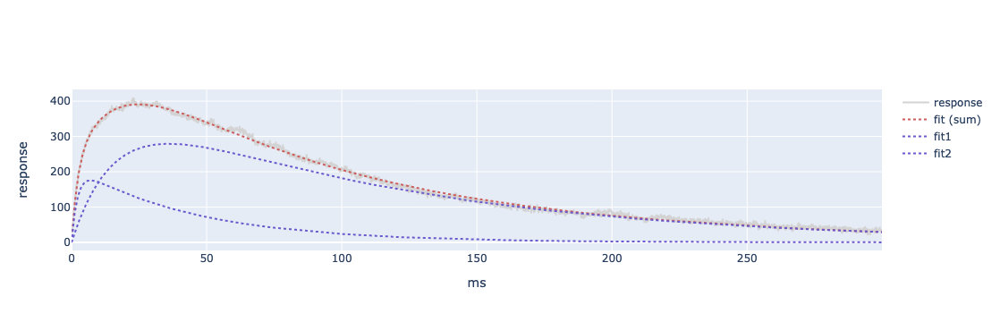

            peak   τrise  τdecay   tpeak rise20-80 decay80-20       area
fast:    175.722   2.226   45.39   7.058     2.336     62.935   9317.747
slow:    279.341  16.074  108.97  36.086    13.205    153.036  42389.736
AIC:   20155.087                                                        


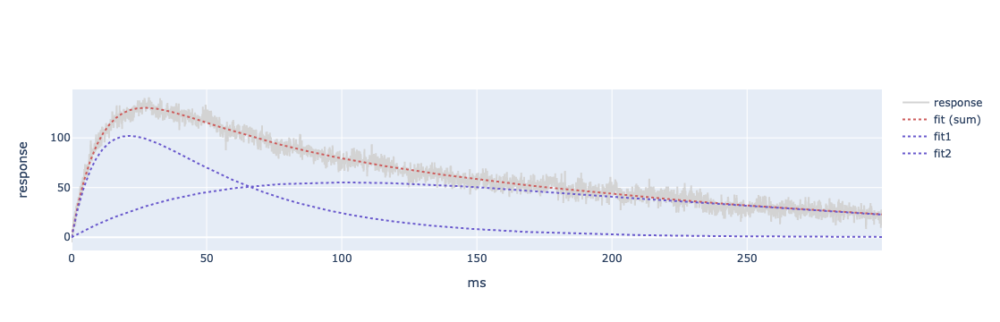

            peak   τrise   τdecay    tpeak rise20-80 decay80-20       area
fast:    102.015  11.669   45.334   21.326     8.076     66.129   7402.622
slow:     55.195  92.635  109.232  100.478    39.367    219.221  15126.569
AIC:   18949.427                                                          


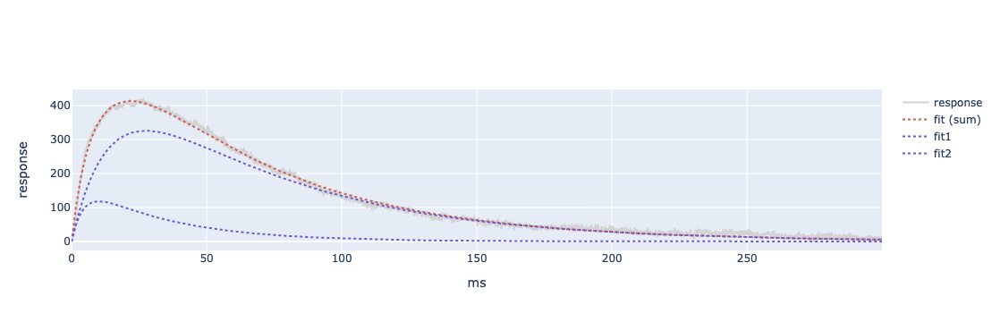

            peak   τrise  τdecay   tpeak rise20-80 decay80-20       area
fast:    118.492   4.309  32.964  10.086     3.658      46.12   5304.169
slow:    326.123  14.285  63.377  27.476    10.331     91.243  31885.343
AIC:   21397.372                                                        


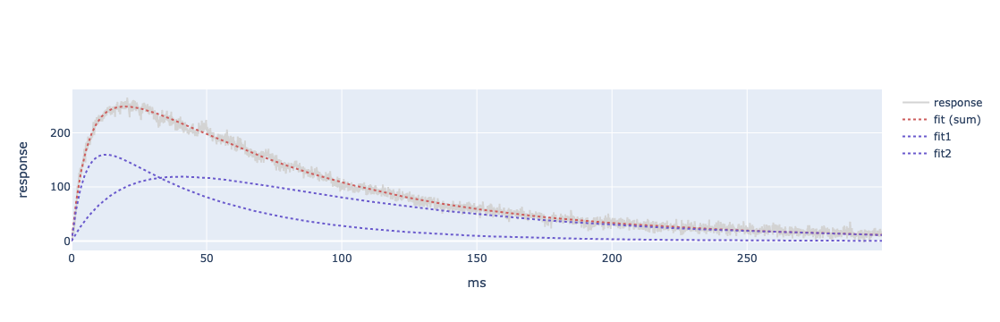

            peak   τrise  τdecay   tpeak rise20-80 decay80-20       area
fast:    159.937   5.094  46.885  12.686     4.533     65.336   9828.674
slow:    119.059  20.352  99.111  40.544    15.162    141.634  17764.175
AIC:   19733.461                                                        


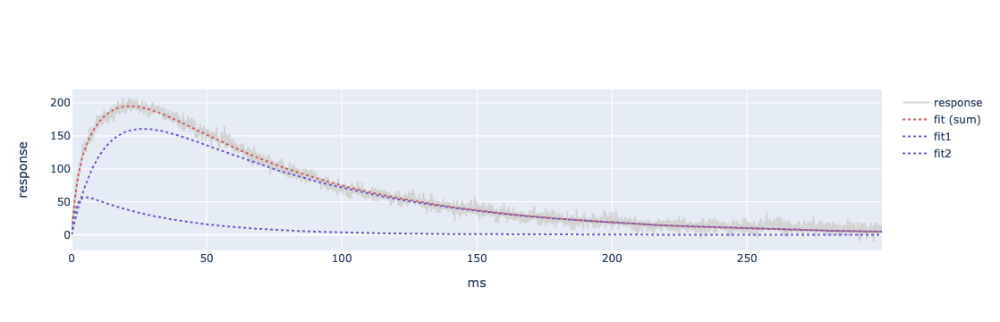

            peak   τrise  τdecay   tpeak rise20-80 decay80-20       area
fast:     56.917   1.677  33.637   5.292     1.755      46.64    2240.71
slow:    160.787  12.371  73.801  26.544       9.8    104.197  17002.558
AIC:   19676.164                                                        


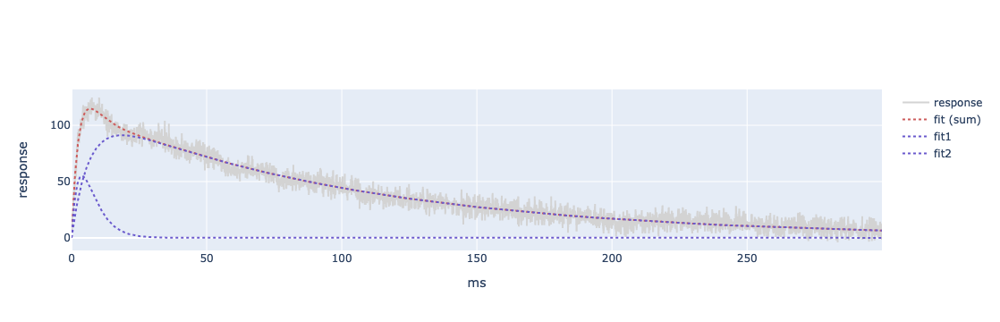

            peak  τrise   τdecay   tpeak rise20-80 decay80-20       area
fast:     54.947   3.69    4.021   3.851     1.509      8.369    575.725
slow:     91.203  6.248  103.649  18.675     6.318    143.762  11319.373
AIC:   18797.822                                                        


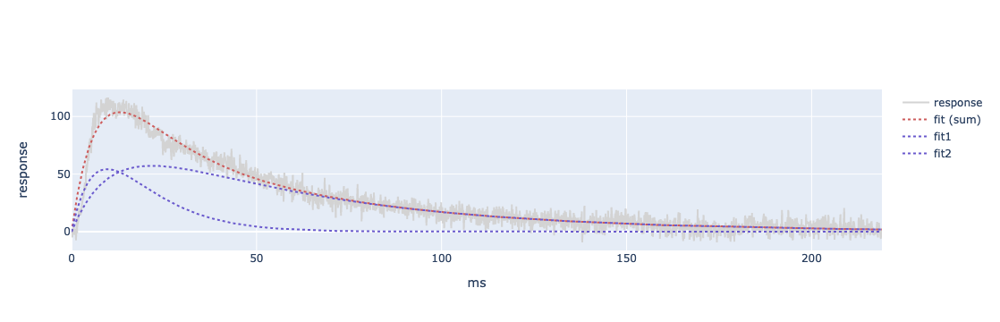

            peak   τrise  τdecay   tpeak rise20-80 decay80-20      area
fast:     54.262   9.452   9.917   9.681     3.795     21.017  1428.341
slow:     57.236  10.696  54.704  21.699     8.091     77.909   4655.38
AIC:   14420.513                                                       


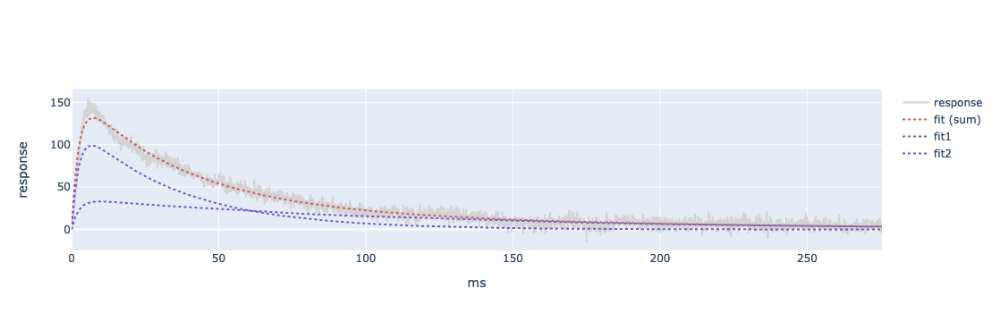

            peak  τrise   τdecay  tpeak rise20-80 decay80-20      area
fast:     99.101  2.418   34.267  6.897      2.37     47.554  4153.066
slow:     33.155  2.418  115.471  9.548     2.855    160.077  4158.427
AIC:   17366.864                                                      


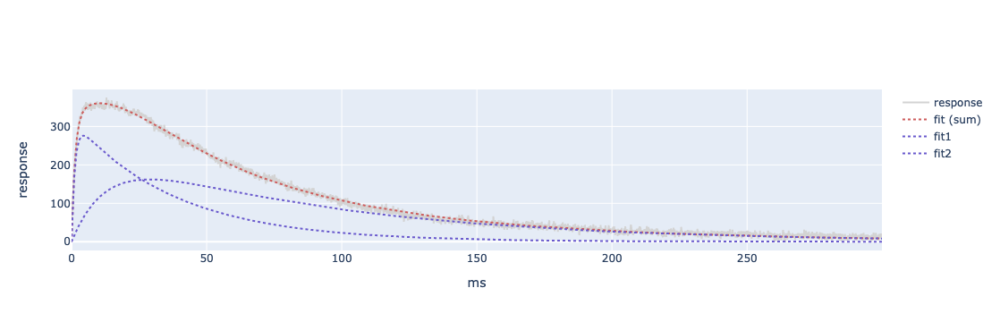

            peak   τrise  τdecay  tpeak rise20-80 decay80-20       area
fast:    276.165   1.244  37.892  4.394     1.389     52.531   11751.06
slow:    162.287  12.956  86.578  28.94    10.601    121.653  19627.459
AIC:   19968.263                                                       


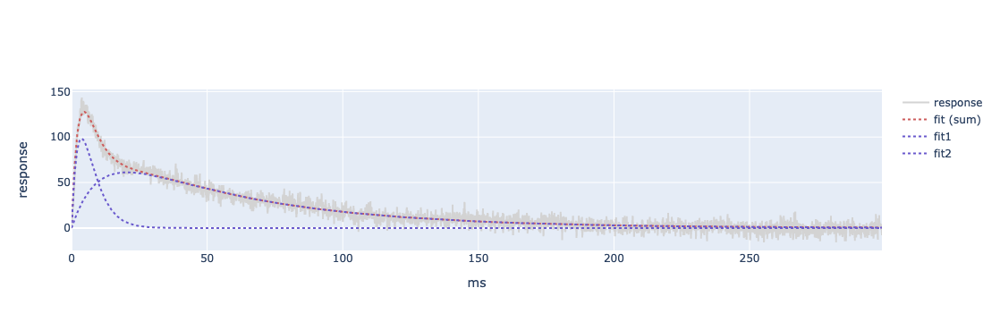

            peak  τrise  τdecay   tpeak rise20-80 decay80-20      area
fast:     98.212  3.624   3.779     3.7      1.45      8.032   988.077
slow:     61.266  9.704  55.545  20.514     7.594     78.584  4923.308
AIC:   18852.142                                                      


In [5]:
# batch analysis
np.random.seed(7)
results = FITproduct2_batch(x, df)

In [6]:
# extract relevant data sets
df1 = results[0]
df2 = df_(df1, 'peak')
df3 = df_(df1, 'τdecay')

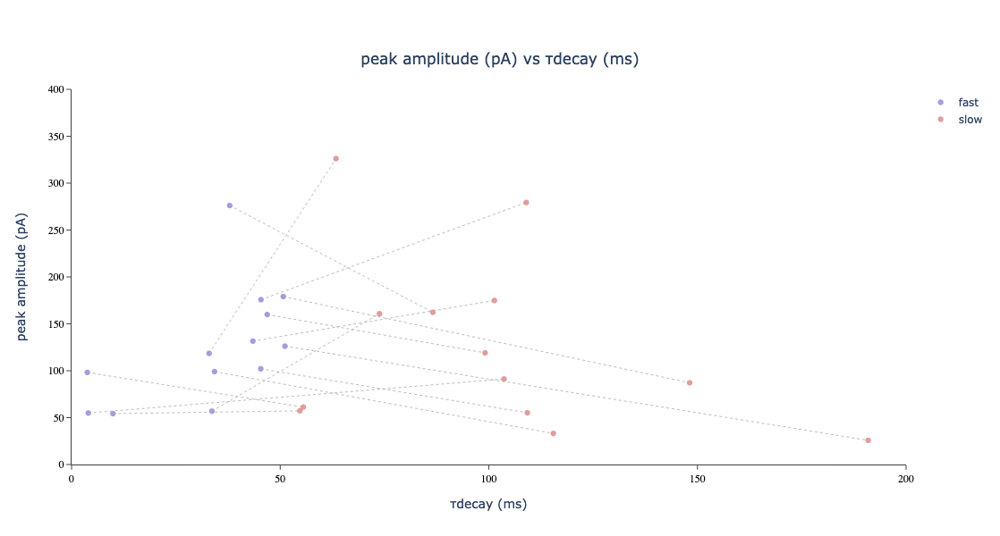

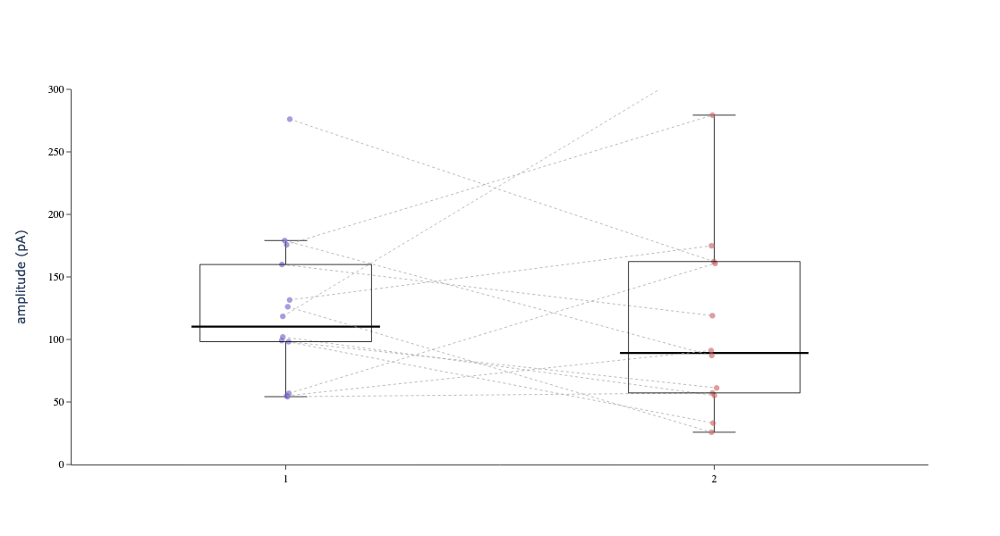

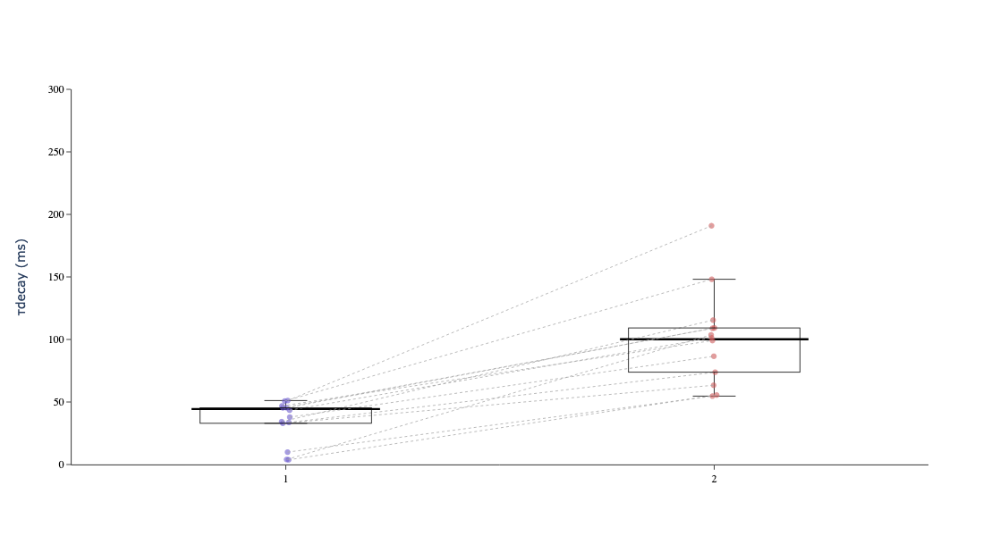

In [7]:
# create graphs
fig1 = plot1(df1, method=0, xrange=(0, 200), yrange=(0, 400))

# fig1 = plot1(df1, method=0, xrange=(0, 300), yrange=(0, 300))
fig2 = WBplot(df2, wid=0.2, cap=0.05, xlab='', ylab='amplitude (pA)', xrange=(0.5, 2.5), yrange=(0, 300), lwd=0.8)
fig3 = WBplot(df3, wid=0.2, cap=0.05, xlab='', ylab='τdecay (ms)', xrange=(0.5, 2.5), yrange=(0, 300), lwd=0.8)

fig1.show()
fig2.show()
fig3.show()

NameError: name 'df1' is not defined

In [8]:
# save graphs 
save = True
if save:
    save_results(df1, folder='example data', filename=filename, out_name='summary', ext='xlsx')
    save_fig(fig=fig1, folder='example data', filename=filename, out_name='fig1')
    save_fig(fig=fig2, folder='example data', filename=filename, out_name='fig2')
    save_fig(fig=fig3, folder='example data', filename=filename, out_name='fig3')
    

In [9]:
# saving an individual fitted trace
# choose a trace eg trace n = 4 
n = 4
y = df.iloc[:, n].values
params = results[2].iloc[n]
trace0 = example_plot(x, y, params)

save_fig(fig=trace0, folder='example data', filename=filename, out_name='trace0')

In [10]:
fig0 = example_plot(x, y, params)

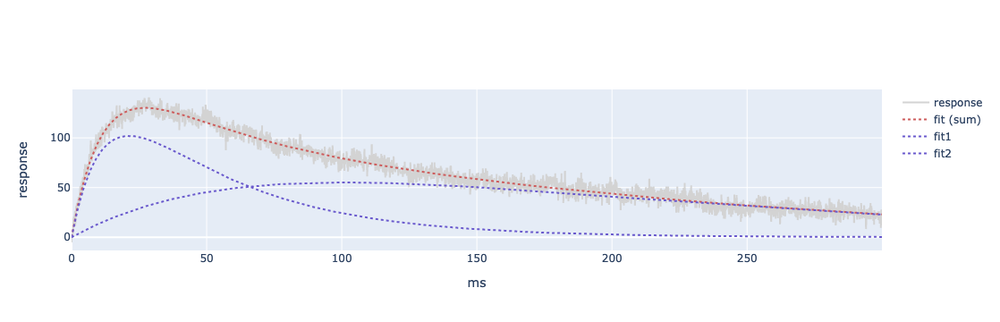

In [11]:
fig0.show()